In [1]:
# Add project root to path
import sys
from pathlib import Path

project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))
print(f"Added {project_root} to Python path")

Added /Users/lfbarba/GitHub/sdate to Python path


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from pathlib import Path
import lovely_tensors as lt
from PIL import Image
import glob
import re
from tqdm.auto import tqdm
import torch

# Import video compression utilities
from sdate.stream_hvec import HevcGray10Streamer, concat_hevc_segments

# Set up lovely_tensors for better tensor visualization
lt.monkey_patch()

# Set up matplotlib for better plots
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['image.cmap'] = 'gray'

print("Libraries imported successfully!")
print("✅ Video streaming compression utilities loaded:")
print("   - HevcGray10Streamer")
print("   - concat_hevc_segments")
from inct.dataset_slices import ProjectionSliceDataset

Libraries imported successfully!
✅ Video streaming compression utilities loaded:
   - HevcGray10Streamer
   - concat_hevc_segments


✅ Found parameters in JC_62d.log: {'num_darks': 10, 'num_flats': 100, 'num_projections': 1501}
📂 Loaded folder: file_1_extracted
   Total TIFF files: 1711
   Darks: 10, Flats: 100, Projections: 1501
   Image dimensions: 2560 x 2160
   Use attenuation: False
ProjectionSliceDataset:
  Volume shape: (1080, 1280, 100)
  Slice dimension: 2
  Slices per batch: 1
  Voxels per slice (dim=2): 1,382,400
Loading 100 projections...
  Loaded 50/100
  Loaded 100/100
Volume shape: (1080, 1280, 100)
Total voxels: 138,240,000
Value range: [8857.5469, 46759.2969]

Volume shape: torch.Size([1080, 1280, 100])
Image size: 1080 × 1280
Frames to compress: 100
  Frame 0: range [0.0000, 1.0000]
  Frame 1: range [0.0000, 1.0000]
  Frame 2: range [0.0000, 1.0000]
  Frame 3: range [0.0000, 1.0000]
  Frame 4: range [0.0000, 1.0000]
  Frame 5: range [0.0000, 1.0000]
  Frame 6: range [0.0000, 1.0000]
  Frame 7: range [0.0000, 1.0000]
  Frame 8: range [0.0000, 1.0000]
  Frame 9: range [0.0000, 1.0000]
  Frame 10: ran

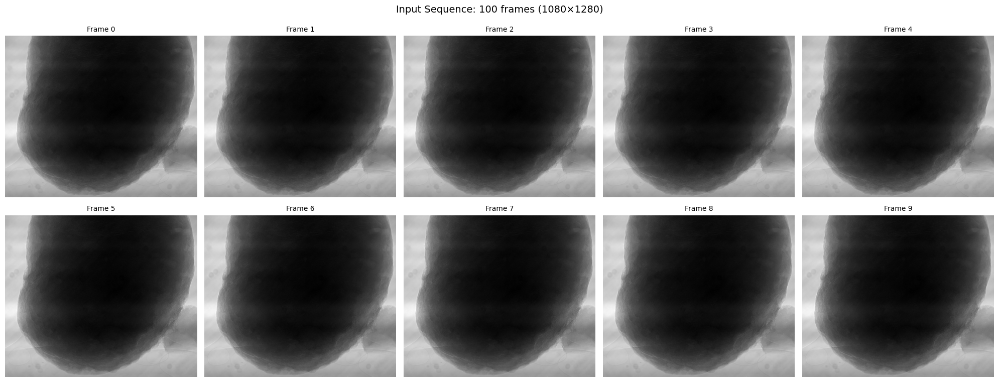

In [3]:
DATA_PATH = Path('../data/ct_files/file_1_extracted')
NUM_PROJECTIONS = 100
TARGET_SIZE      = (2560 // 2, 2160 // 2)
N_FRAMES = 100  # Number of frames to compress

dataset = ProjectionSliceDataset(
    folder_path=DATA_PATH,
    num_projections=NUM_PROJECTIONS,
    target_size=TARGET_SIZE,
    normalize_values=True,
    verbose=True,
    cache_volume=True,
    use_attenuation=False,
)

volume = dataset.get_full_volume()  # (H, W, D)

H, W = volume.shape[:2]
print(f"\nVolume shape: {volume.shape}")
print(f"Image size: {H} × {W}")
print(f"Frames to compress: {N_FRAMES}")

# Extract and normalise frames
frames = []
for i in range(N_FRAMES):
    img = volume[:, :, i].clone()
    img_min, img_max = img.min(), img.max()
    img = (img - img_min) / (img_max - img_min + 1e-8)
    frames.append(img)
    print(f"  Frame {i}: range [{img.min():.4f}, {img.max():.4f}]")

# ── Show all frames ───────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(frames[i].cpu().numpy(), cmap='gray', vmin=0, vmax=1)
    ax.set_title(f'Frame {i}', fontsize=10)
    ax.axis('off')
plt.suptitle(f'Input Sequence: {N_FRAMES} frames ({H}×{W})', fontsize=14)
plt.tight_layout()
plt.show()

In [4]:
residuals = volume[:, :, :-1] - volume[:, :, 1:]
residuals = residuals.permute(2, 0, 1)  # (D-1, H, W)
residuals, volume

(tensor[99, 1080, 1280] n=136857600 (0.5Gb) x∈[-3.220e+03, 2.000e+03] μ=-3.063 σ=157.894,
 tensor[1080, 1280, 100] n=138240000 (0.5Gb) x∈[8.858e+03, 4.676e+04] μ=2.043e+04 σ=1.009e+04)

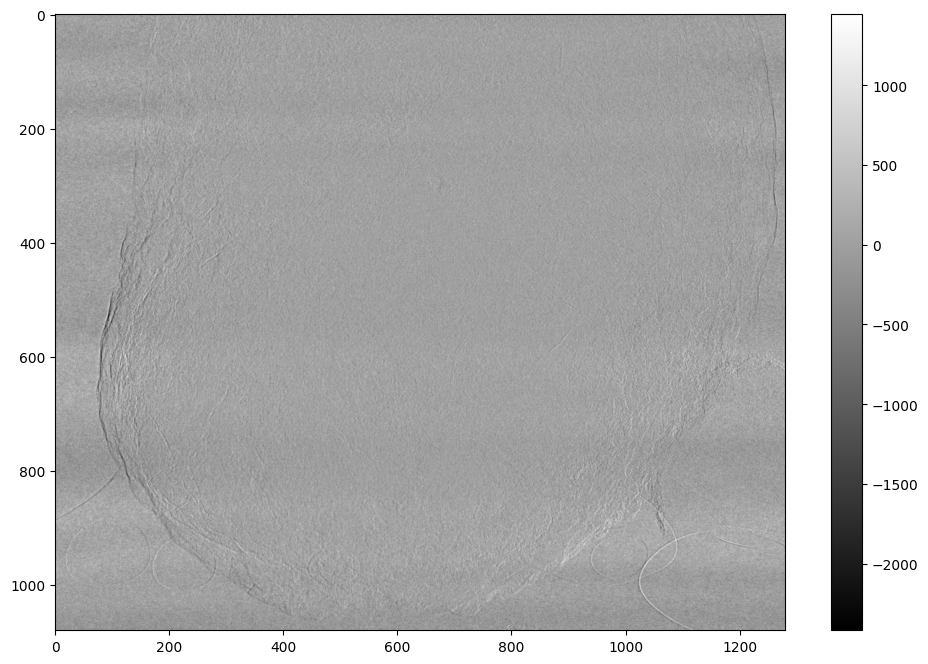

In [5]:
plt.imshow(residuals[0].cpu().numpy(), cmap='gray')
plt.colorbar()

tensor[1080, 1280] n=1382400 (5.3Mb) x∈[-422.891, 422.984] μ=0.340 σ=101.574

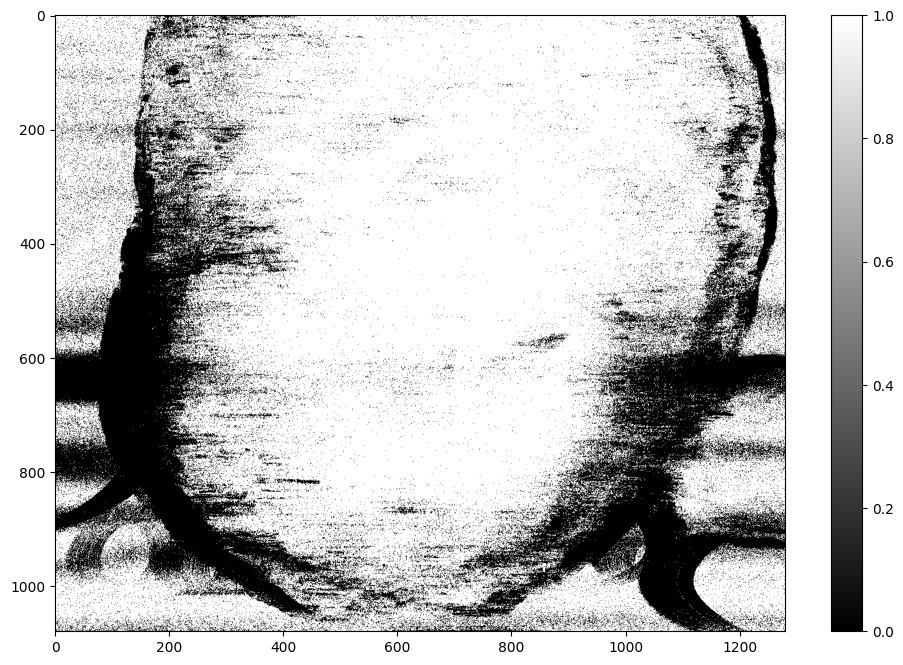

In [6]:
quantile = 99
masks = []
for idx in range(residuals.shape[0]):
    mask = (residuals[idx].abs() < residuals[idx].abs().quantile(quantile / 100))
    masks.append(mask)
global_mask = torch.stack(masks, dim=0).prod(dim=0)
inverse_mask = 1 - global_mask.float()
    
plt.imshow(global_mask, cmap='gray')
plt.colorbar()
residuals[idx] * global_mask

## 5. Dual-Stream HEVC Encoding (Masked + Inverse-Masked Residuals)

Split the residuals into two streams based on the `global_mask`:

| Stream | Content | Quality | Rationale |
|--------|---------|---------|-----------|
| **High-change** | `residuals × global_mask` | cq = 60 | Large residuals need more bits |
| **Low-change** | `residuals × (1 − global_mask)` | cq = 100 | Small residuals can tolerate lower fidelity |

Each frame in each stream is independently normalised to $[0, 1]$ before encoding.
The per-frame `(min, max)` are stored so that normalisation can be **inverted** at decode time.
The reconstructed residuals are the sum of both denormalised streams.

**Compression ratio** accounts for both HEVC files **plus** the normalisation metadata.

In [7]:
import math
from sdate.stream_hvec.stream_gray10 import EncoderParams
from sdate.video_compression.hevc_grayscale import decode_hevc_grayscale_10bit
from skimage.metrics import structural_similarity as _skimage_ssim

# ── Configuration ─────────────────────────────────────────────────────────
CQ_HIGH_CHANGE = 95    # quality for residuals * global_mask
CQ_LOW_CHANGE  = 95   # quality for residuals * (1 - global_mask)

raw_bytes_per_frame = H * W * 2  # int16 baseline
n_frames = residuals.shape[0]
print(f"Raw frame size: {raw_bytes_per_frame / 1e3:.1f} kB  ({H}×{W} px × 2 B)")
print(f"Total raw for {n_frames} frames: {n_frames * raw_bytes_per_frame / 1e6:.2f} MB\n")

outdir = Path('dual_stream_output')
outdir.mkdir(parents=True, exist_ok=True)

# global_mask = torch.ones_like(global_mask)  # --- IGNORE --- Use all pixels in high-change stream
# inverse_mask = 1 - global_mask.float()       # --- IGNORE --- No pixels in low-change stream

# ── Helper: encode a stream with per-frame normalisation ──────────────────
def encode_stream(data, mask, cq, prefix, range_scale=1.0):
    """Encode masked residuals, returning (seg_path, norms).
    
    norms is a list of (frame_min, frame_max) used for denormalisation.
    """
    params = EncoderParams(
        cq_hw=cq,
        preset_sw="medium",
        fps=30,
        force_software=False,
    )
    streamer = HevcGray10Streamer(outdir, segment_prefix=prefix, params=params)
    norms = []
    with streamer.start_segment():
        for frame in data:
            masked = frame * mask
            fmin, fmax = masked.min() * range_scale, masked.max() * range_scale
            norms.append((float(fmin), float(fmax)))
            normed = (masked - fmin) / (fmax - fmin + 1e-8)
            streamer.append_frame(normed.float())
    return streamer.segments[0], norms

# ── Encode both streams ──────────────────────────────────────────────────
print("▶ Encoding high-change stream (residuals × global_mask) ...")
seg_hi, norms_hi = encode_stream(residuals, global_mask.float(), CQ_HIGH_CHANGE, "dual_hi", range_scale=2.0)
bytes_hi = seg_hi.stat().st_size
print(f"  File: {seg_hi.name}  |  Size: {bytes_hi / 1e6:.3f} MB")

print("▶ Encoding low-change stream (residuals × (1 − global_mask)) ...")
seg_lo, norms_lo = encode_stream(residuals, inverse_mask, CQ_LOW_CHANGE, "dual_lo", range_scale=1.0)
bytes_lo = seg_lo.stat().st_size
print(f"  File: {seg_lo.name}  |  Size: {bytes_lo / 1e6:.3f} MB")

# Normalisation metadata size: 2 floats (float32) per frame × 2 streams
norm_bytes = n_frames * 2 * 4 * 2  # 2 values × 4 bytes × 2 streams
total_compressed = bytes_hi + bytes_lo + norm_bytes
print(f"\n  Norm metadata: {norm_bytes} B  ({n_frames} frames × 2 streams × 8 B)")
print(f"  Total compressed: {total_compressed / 1e6:.3f} MB")

# ── Decode & denormalise ─────────────────────────────────────────────────
print("\n▶ Decoding high-change stream ...")
decoded_hi = decode_hevc_grayscale_10bit(str(seg_hi))  # (T, H, W)

print("▶ Decoding low-change stream ...")
decoded_lo = decode_hevc_grayscale_10bit(str(seg_lo))   # (T, H, W)

# Reverse normalisation
reconstructed = torch.zeros_like(residuals)
for i in range(n_frames):
    fmin_hi, fmax_hi = norms_hi[i]
    frame_hi = decoded_hi[i].float() * (fmax_hi - fmin_hi + 1e-8) + fmin_hi

    fmin_lo, fmax_lo = norms_lo[i]
    frame_lo = decoded_lo[i].float() * (fmax_lo - fmin_lo + 1e-8) + fmin_lo

    reconstructed[i] = frame_hi * (1 - inverse_mask) + frame_lo * inverse_mask

print("✅ Reconstruction complete")

# ── Per-frame metrics vs original residuals ──────────────────────────────
def _psnr(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    mse = float(np.mean((np.clip(pred, tgt.min(), tgt.max()) - tgt) ** 2))
    return 10 * math.log10(dr ** 2 / (mse + 1e-10))

def _ssim(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    return float(_skimage_ssim(tgt, np.clip(pred, tgt.min(), tgt.max()), data_range=dr))

frame_metrics = []
for i in range(n_frames):
    rec_np = reconstructed[i].cpu().numpy()
    tgt_np = residuals[i].cpu().numpy()
    frame_metrics.append({
        "psnr": _psnr(rec_np, tgt_np),
        "ssim": _ssim(rec_np, tgt_np),
    })

avg_psnr = float(np.mean([m["psnr"] for m in frame_metrics]))
avg_ssim = float(np.mean([m["ssim"] for m in frame_metrics]))
raw_total = n_frames * raw_bytes_per_frame
cr = raw_total / total_compressed

print(f"\n{'─'*60}")
print(f"  Avg PSNR: {avg_psnr:.2f} dB")
print(f"  Avg SSIM: {avg_ssim:.4f}")
print(f"  Compression ratio: {cr:.2f}×")
print(f"{'─'*60}")

Raw frame size: 2764.8 kB  (1080×1280 px × 2 B)
Total raw for 99 frames: 273.72 MB

▶ Encoding high-change stream (residuals × global_mask) ...
  File: dual_hi_0000.mov  |  Size: 89.872 MB
▶ Encoding low-change stream (residuals × (1 − global_mask)) ...
  File: dual_lo_0000.mov  |  Size: 46.268 MB

  Norm metadata: 1584 B  (99 frames × 2 streams × 8 B)
  Total compressed: 136.142 MB

▶ Decoding high-change stream ...


/Users/lfbarba/GitHub/sdate/sdate/video_compression/hevc_grayscale.py:194: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:209.)
  vf = torch.from_numpy(v16).to(torch.float32) / 65535.0


▶ Decoding low-change stream ...
✅ Reconstruction complete

────────────────────────────────────────────────────────────
  Avg PSNR: 54.49 dB
  Avg SSIM: 0.9984
  Compression ratio: 2.01×
────────────────────────────────────────────────────────────


In [8]:
# ── Reconstruct frame sequence from first frame + decoded residuals ───────
# residuals[i] = volume[:,:,i] - volume[:,:,i+1]
# => frame_{i+1} = frame_i - residual_i

first_frame = volume[:, :, 0]  # anchor frame (stored uncompressed)
n_total_frames = n_frames + 1  # first frame + n_frames residuals

# Reconstruct using decoded residuals
recon_frames = torch.zeros(n_total_frames, H, W)
recon_frames[0] = first_frame
for i in range(n_frames):
    recon_frames[i + 1] = recon_frames[i] - reconstructed[i]

# Original frames from volume
orig_frames = volume[:, :, :n_total_frames].permute(2, 0, 1)  # (n_total_frames, H, W)

# Per-frame metrics on reconstructed frames
frame_recon_metrics = []
for i in range(n_total_frames):
    rec_np = recon_frames[i].cpu().numpy()
    tgt_np = orig_frames[i].cpu().numpy()
    frame_recon_metrics.append({
        "psnr": _psnr(rec_np, tgt_np),
        "ssim": _ssim(rec_np, tgt_np),
    })

avg_frame_psnr = float(np.mean([m["psnr"] for m in frame_recon_metrics]))
avg_frame_ssim = float(np.mean([m["ssim"] for m in frame_recon_metrics]))

# Note: frame 0 is identical (no compression), so also show stats excluding it
avg_frame_psnr_no0 = float(np.mean([m["psnr"] for m in frame_recon_metrics[1:]]))
avg_frame_ssim_no0 = float(np.mean([m["ssim"] for m in frame_recon_metrics[1:]]))

print("Frame reconstruction from first frame + decoded residuals")
print(f"{'─'*60}")
print(f"  Frame 0 (anchor):    PSNR = {frame_recon_metrics[0]['psnr']:.2f} dB, SSIM = {frame_recon_metrics[0]['ssim']:.4f}")
print(f"  Avg (all {n_total_frames} frames): PSNR = {avg_frame_psnr:.2f} dB, SSIM = {avg_frame_ssim:.4f}")
print(f"  Avg (frames 1‥{n_frames}):  PSNR = {avg_frame_psnr_no0:.2f} dB, SSIM = {avg_frame_ssim_no0:.4f}")
print(f"{'─'*60}")

# Per-frame breakdown
print(f"\n{'Frame':>6} {'PSNR (dB)':>10} {'SSIM':>8}")
for i, m in enumerate(frame_recon_metrics):
    marker = " ← anchor" if i == 0 else ""
    print(f"{i:>6} {m['psnr']:>10.2f} {m['ssim']:>8.4f}{marker}")

Frame reconstruction from first frame + decoded residuals
────────────────────────────────────────────────────────────
  Frame 0 (anchor):    PSNR = 191.47 dB, SSIM = 1.0000
  Avg (all 100 frames): PSNR = 61.01 dB, SSIM = 0.9987
  Avg (frames 1‥99):  PSNR = 59.69 dB, SSIM = 0.9987
────────────────────────────────────────────────────────────

 Frame  PSNR (dB)     SSIM
     0     191.47   1.0000 ← anchor
     1      81.21   1.0000
     2      76.23   1.0000
     3      73.45   1.0000
     4      70.42   0.9999
     5      68.71   0.9999
     6      67.93   0.9999
     7      67.11   0.9998
     8      66.37   0.9998
     9      65.76   0.9998
    10      65.25   0.9997
    11      64.70   0.9997
    12      64.40   0.9997
    13      64.12   0.9996
    14      63.75   0.9996
    15      63.32   0.9996
    16      63.19   0.9996
    17      62.83   0.9995
    18      62.72   0.9995
    19      62.46   0.9995
    20      62.14   0.9994
    21      61.57   0.9994
    22      61.59   0.9994

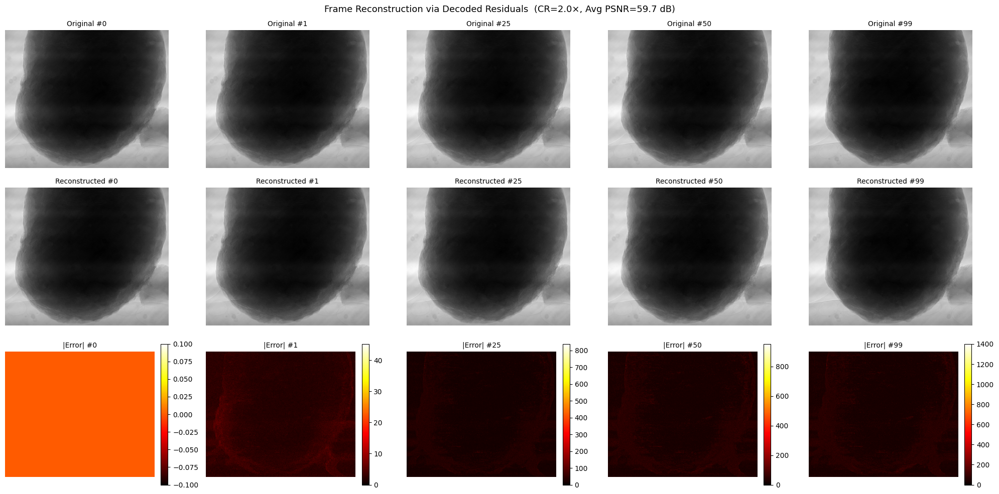

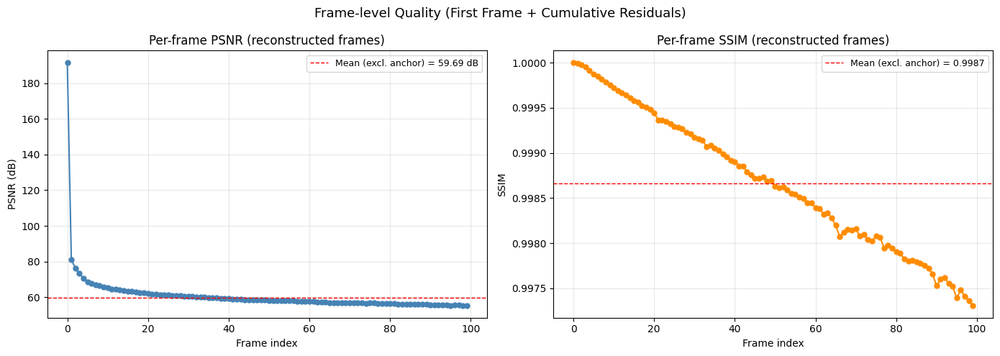

In [9]:
# ── Visualise reconstructed frames vs originals ─────────────────────────
show_idxs = [0, 1, n_total_frames // 4, n_total_frames // 2, n_total_frames - 1]
show_idxs = sorted(set(i for i in show_idxs if i < n_total_frames))

fig, axes = plt.subplots(3, len(show_idxs), figsize=(4 * len(show_idxs), 10))

for col, fi in enumerate(show_idxs):
    orig_f = orig_frames[fi].cpu().numpy()
    rec_f  = recon_frames[fi].cpu().numpy()
    diff_f = np.abs(orig_f - rec_f)

    vmin, vmax = orig_f.min(), orig_f.max()

    axes[0, col].imshow(orig_f, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, col].set_title(f'Original #{fi}', fontsize=10)
    axes[0, col].axis('off')

    axes[1, col].imshow(rec_f, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, col].set_title(f'Reconstructed #{fi}', fontsize=10)
    axes[1, col].axis('off')

    im = axes[2, col].imshow(diff_f, cmap='hot')
    axes[2, col].set_title(f'|Error| #{fi}', fontsize=10)
    axes[2, col].axis('off')
    plt.colorbar(im, ax=axes[2, col], fraction=0.046, pad=0.04)

axes[0, 0].set_ylabel('Original', fontsize=11)
axes[1, 0].set_ylabel('Reconstructed', fontsize=11)
axes[2, 0].set_ylabel('Abs Error', fontsize=11)

plt.suptitle(f'Frame Reconstruction via Decoded Residuals  '
             f'(CR={cr:.1f}×, Avg PSNR={avg_frame_psnr_no0:.1f} dB)', fontsize=13)
plt.tight_layout()
plt.show()

# ── Per-frame PSNR/SSIM for reconstructed frames ────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

fpsnrs = [m["psnr"] for m in frame_recon_metrics]
fssims = [m["ssim"] for m in frame_recon_metrics]

axes[0].plot(range(n_total_frames), fpsnrs, 'o-', color='steelblue', linewidth=1.5, markersize=5)
axes[0].axhline(avg_frame_psnr_no0, color='red', linestyle='--', linewidth=1,
                label=f'Mean (excl. anchor) = {avg_frame_psnr_no0:.2f} dB')
axes[0].set_xlabel('Frame index')
axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('Per-frame PSNR (reconstructed frames)')
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.3)

axes[1].plot(range(n_total_frames), fssims, 'o-', color='darkorange', linewidth=1.5, markersize=5)
axes[1].axhline(avg_frame_ssim_no0, color='red', linestyle='--', linewidth=1,
                label=f'Mean (excl. anchor) = {avg_frame_ssim_no0:.4f}')
axes[1].set_xlabel('Frame index')
axes[1].set_ylabel('SSIM')
axes[1].set_title('Per-frame SSIM (reconstructed frames)')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.suptitle('Frame-level Quality (First Frame + Cumulative Residuals)', fontsize=13)
plt.tight_layout()
plt.show()

In [10]:
# ── Summary table ────────────────────────────────────────────────────────
print(f"{'Component':25} {'Size (MB)':>10} {'Share':>8}")
print("─" * 48)
print(f"{'High-change (cq=' + str(CQ_HIGH_CHANGE) + ')':25} {bytes_hi/1e6:>10.3f} {bytes_hi/total_compressed*100:>7.1f}%")
print(f"{'Low-change  (cq=' + str(CQ_LOW_CHANGE) + ')':25} {bytes_lo/1e6:>10.3f} {bytes_lo/total_compressed*100:>7.1f}%")
print(f"{'Norm metadata':25} {norm_bytes/1e6:>10.6f} {norm_bytes/total_compressed*100:>7.3f}%")
print("─" * 48)
print(f"{'Total compressed':25} {total_compressed/1e6:>10.3f} {'100.0':>7}%")
print(f"{'Raw (int16)':25} {raw_total/1e6:>10.3f}")
print(f"\n  Compression ratio: {cr:.2f}×")
print(f"  Avg PSNR:          {avg_psnr:.2f} dB")
print(f"  Avg SSIM:          {avg_ssim:.4f}")

Component                  Size (MB)    Share
────────────────────────────────────────────────
High-change (cq=95)           89.872    66.0%
Low-change  (cq=95)           46.268    34.0%
Norm metadata               0.001584   0.001%
────────────────────────────────────────────────
Total compressed             136.142   100.0%
Raw (int16)                  273.715

  Compression ratio: 2.01×
  Avg PSNR:          54.49 dB
  Avg SSIM:          0.9984


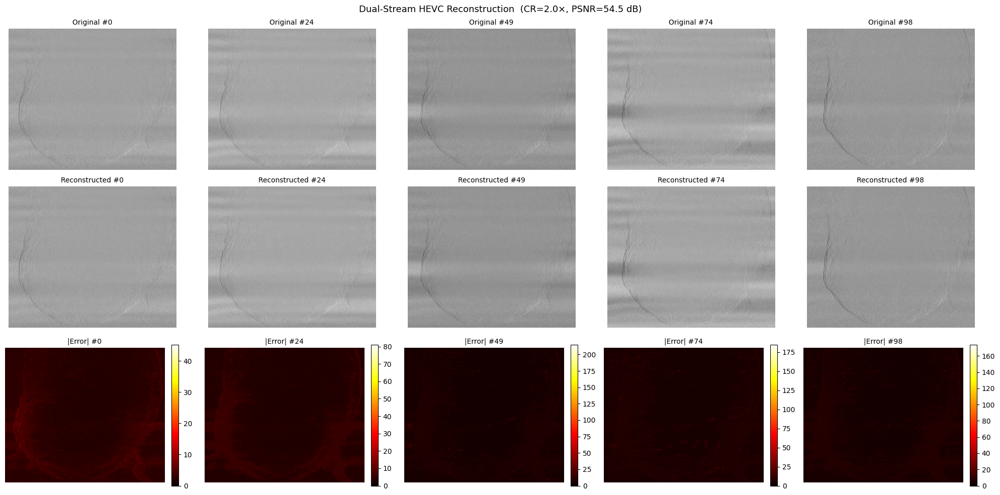

In [11]:
# ── Visual comparison: original vs reconstructed residuals ────────────────
show_frames = [0, n_frames // 4, n_frames // 2, 3 * n_frames // 4, n_frames - 1]
show_frames = sorted(set(f for f in show_frames if f < n_frames))

fig, axes = plt.subplots(3, len(show_frames), figsize=(4 * len(show_frames), 10))

for col, fi in enumerate(show_frames):
    orig = residuals[fi].cpu().numpy()
    recon = reconstructed[fi].cpu().numpy()
    diff = np.abs(orig - recon)

    vmin, vmax = orig.min(), orig.max()

    axes[0, col].imshow(orig, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, col].set_title(f'Original #{fi}', fontsize=10)
    axes[0, col].axis('off')

    axes[1, col].imshow(recon, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, col].set_title(f'Reconstructed #{fi}', fontsize=10)
    axes[1, col].axis('off')

    im = axes[2, col].imshow(diff, cmap='hot')
    axes[2, col].set_title(f'|Error| #{fi}', fontsize=10)
    axes[2, col].axis('off')
    plt.colorbar(im, ax=axes[2, col], fraction=0.046, pad=0.04)

axes[0, 0].set_ylabel('Original', fontsize=11)
axes[1, 0].set_ylabel('Reconstructed', fontsize=11)
axes[2, 0].set_ylabel('Abs Error', fontsize=11)

plt.suptitle(f'Dual-Stream HEVC Reconstruction  (CR={cr:.1f}×, PSNR={avg_psnr:.1f} dB)', fontsize=13)
plt.tight_layout()
plt.show()

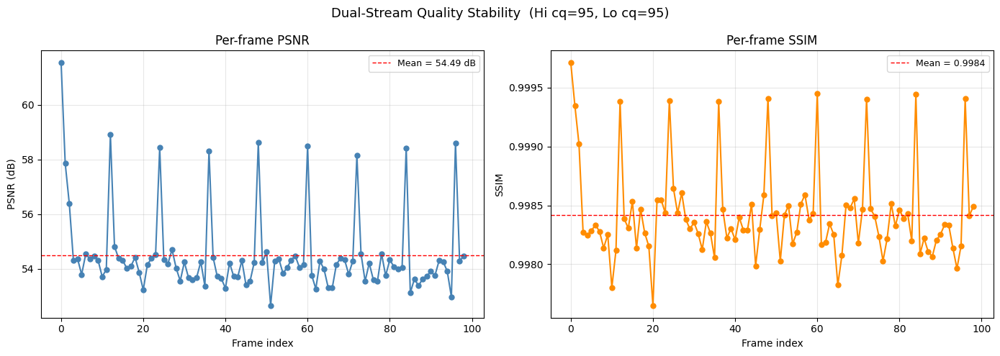

In [12]:
# ── Per-frame PSNR & SSIM stability ──────────────────────────────────────
per_psnrs = [m["psnr"] for m in frame_metrics]
per_ssims = [m["ssim"] for m in frame_metrics]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(range(n_frames), per_psnrs, 'o-', color='steelblue', linewidth=1.5, markersize=5)
axes[0].axhline(avg_psnr, color='red', linestyle='--', linewidth=1,
                label=f'Mean = {avg_psnr:.2f} dB')
axes[0].set_xlabel('Frame index')
axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('Per-frame PSNR')
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.3)

axes[1].plot(range(n_frames), per_ssims, 'o-', color='darkorange', linewidth=1.5, markersize=5)
axes[1].axhline(avg_ssim, color='red', linestyle='--', linewidth=1,
                label=f'Mean = {avg_ssim:.4f}')
axes[1].set_xlabel('Frame index')
axes[1].set_ylabel('SSIM')
axes[1].set_title('Per-frame SSIM')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.suptitle(f'Dual-Stream Quality Stability  (Hi cq={CQ_HIGH_CHANGE}, Lo cq={CQ_LOW_CHANGE})', fontsize=13)
plt.tight_layout()
plt.show()

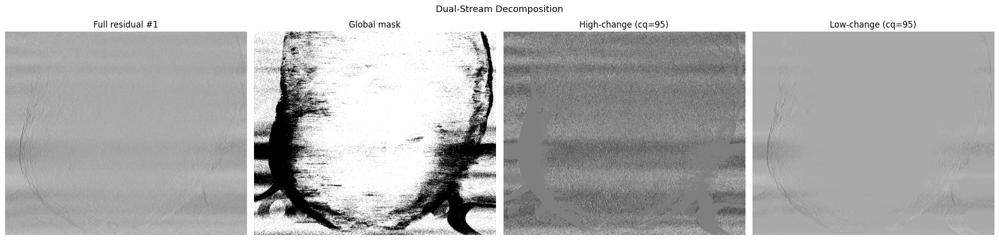

In [13]:
# ── Visualise the two streams and mask for a sample frame ────────────────
sample_idx = 1
orig = residuals[sample_idx].cpu().numpy()
hi_part = (residuals[sample_idx] * global_mask.float()).cpu().numpy()
lo_part = (residuals[sample_idx] * inverse_mask).cpu().numpy()
mask_np = global_mask.cpu().numpy()

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(orig, cmap='gray')
axes[0].set_title(f'Full residual #{sample_idx}')
axes[0].axis('off')

axes[1].imshow(mask_np, cmap='gray', vmin=0, vmax=1)
axes[1].set_title('Global mask')
axes[1].axis('off')

axes[2].imshow(hi_part, cmap='gray')
axes[2].set_title(f'High-change (cq={CQ_HIGH_CHANGE})')
axes[2].axis('off')

axes[3].imshow(lo_part, cmap='gray')
axes[3].set_title(f'Low-change (cq={CQ_LOW_CHANGE})')
axes[3].axis('off')

plt.suptitle('Dual-Stream Decomposition', fontsize=13)
plt.tight_layout()
plt.show()

## 6. Closed-Loop Residual Encoding → Re-encoded Single Stream

1. **Closed-loop pass**: encode each frame/residual as a separate segment (one frame each),
   decode immediately to compute the next residual from the *decoded* reconstruction (no drift).
2. **Re-encode pass**: read all normalised frames back from the per-segment files and feed them
   into a **single continuous HEVC stream** so the codec can exploit inter-frame prediction.
3. Decode the re-encoded stream, denormalise, reconstruct, and measure quality.

This combines the quality stability of closed-loop residuals with the compression
gains of a single-stream HEVC file.

In [14]:
# ── Closed-loop + re-encode into single stream ──────────────────────────
import math
from sdate.stream_hvec.stream_gray10 import (
    EncoderParams, HevcGray10Streamer,
    open_hevc_gray10_stream, append_hevc_gray10_frame, close_hevc_gray10_stream,
)
from sdate.video_compression.hevc_grayscale import decode_hevc_grayscale_10bit
from skimage.metrics import structural_similarity as _skimage_ssim

CQ_SEQ = 80  # quality for all encoding

seq_outdir = Path('closed_loop_reenc_output')
seq_outdir.mkdir(parents=True, exist_ok=True)

n_frames_seq = volume.shape[2]
raw_bytes_per_frame_seq = H * W * 2

seq_norms = []   # (fmin, fmax) per encoded frame
seq_recon = torch.zeros(n_frames_seq, H, W)
seq_normed_frames = []  # store normalised frames for re-encode pass

params_seq = EncoderParams(
    cq_hw=CQ_SEQ,
    preset_sw="medium",
    fps=30,
    force_software=False,
)

# ═══════════════════════════════════════════════════════════════════════════
# PASS 1: Closed-loop per-segment encoding (identical to §7)
# ═══════════════════════════════════════════════════════════════════════════
print(f"Pass 1 — Closed-loop per-segment: {n_frames_seq} frames at cq={CQ_SEQ}")
print(f"{'─'*60}")

seg1_dir = seq_outdir / "segments"
seg1_dir.mkdir(parents=True, exist_ok=True)
seq_paths = []

for fi in range(n_frames_seq):
    if fi == 0:
        signal = volume[:, :, 0]
        label = "frame"
    else:
        signal = seq_recon[fi - 1] - volume[:, :, fi]  # closed-loop residual
        label = "resid"

    fmin, fmax = float(signal.min()), float(signal.max())
    seq_norms.append((fmin, fmax))
    normed = (signal - fmin) / (fmax - fmin + 1e-8)
    seq_normed_frames.append(normed.float())

    # encode one frame per segment
    s = HevcGray10Streamer(seg1_dir, segment_prefix=f"seg_{fi:04d}", params=params_seq)
    with s.start_segment():
        s.append_frame(normed.float())
    seg_path = s.segments[0]
    seq_paths.append(seg_path)

    # decode immediately to build closed-loop reconstruction
    decoded_frame = decode_hevc_grayscale_10bit(str(seg_path))[0].float()
    denormed = decoded_frame * (fmax - fmin + 1e-8) + fmin

    if fi == 0:
        seq_recon[0] = denormed
    else:
        seq_recon[fi] = seq_recon[fi - 1] - denormed

    if fi < 5 or fi == n_frames_seq - 1 or fi % 20 == 0:
        seg_bytes = seg_path.stat().st_size
        print(f"  [{label}] Frame {fi:3d}: range [{fmin:.6f}, {fmax:.6f}] | "
              f"seg: {seg_bytes/1e3:.1f} kB")

total_seg_bytes = sum(p.stat().st_size for p in seq_paths)
print(f"\n  Pass 1 total (segments): {total_seg_bytes / 1e6:.3f} MB")

# ═══════════════════════════════════════════════════════════════════════════
# PASS 2: Re-encode all normalised frames into a single continuous stream
# ═══════════════════════════════════════════════════════════════════════════
print(f"\n{'─'*60}")
print(f"Pass 2 — Re-encoding {n_frames_seq} normalised frames into single stream ...")

reenc_params_seq = EncoderParams(
    cq_hw=100,
    preset_sw="medium",
    fps=30,
    force_software=False,
)

reenc_streamer = open_hevc_gray10_stream(
    base_path=seq_outdir,
    segment_prefix="reencoded",
    params=reenc_params_seq,
)

for fi in range(n_frames_seq):
    append_hevc_gray10_frame(reenc_streamer, seq_normed_frames[fi])

close_hevc_gray10_stream(reenc_streamer)

reenc_path = reenc_streamer.segments[0]
reenc_bytes = reenc_path.stat().st_size
norm_meta_bytes = n_frames_seq * 2 * 4  # 2 floats × 4 bytes
total_seq_bytes = reenc_bytes + norm_meta_bytes
raw_total_seq = n_frames_seq * raw_bytes_per_frame_seq
cr_seq = raw_total_seq / total_seq_bytes

print(f"  Re-encoded file: {reenc_path.name}  ({reenc_bytes / 1e6:.3f} MB)")
print(f"  Norm metadata:   {norm_meta_bytes} B")
print(f"  Total:           {total_seq_bytes / 1e6:.3f} MB")
print(f"  Segments total:  {total_seg_bytes / 1e6:.3f} MB  (pass 1, for reference)")
print(f"  Raw (int16):     {raw_total_seq / 1e6:.3f} MB")
print(f"  CR:              {cr_seq:.2f}×")
print(f"  Saving vs segs:  {(1 - reenc_bytes / total_seg_bytes) * 100:.1f}%")

# ═══════════════════════════════════════════════════════════════════════════
# Decode re-encoded stream & reconstruct
# ═══════════════════════════════════════════════════════════════════════════
print(f"\n{'─'*60}")
print("Pass 3 — Decode re-encoded stream & reconstruct ...")

decoded_all = decode_hevc_grayscale_10bit(str(reenc_path))  # (n_frames_seq, H, W)

seq_recon_reenc = torch.zeros(n_frames_seq, H, W)
for fi in range(n_frames_seq):
    fmin, fmax = seq_norms[fi]
    denormed = decoded_all[fi].float() * (fmax - fmin + 1e-8) + fmin
    if fi == 0:
        seq_recon_reenc[0] = denormed
    else:
        seq_recon_reenc[fi] = seq_recon_reenc[fi - 1] - denormed

# Use re-encoded reconstruction for downstream metrics
seq_recon = seq_recon_reenc

# ── Per-frame metrics ────────────────────────────────────────────────────
def _psnr_seq(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    mse = float(np.mean((np.clip(pred, tgt.min(), tgt.max()) - tgt) ** 2))
    return 10 * math.log10(dr ** 2 / (mse + 1e-10))

def _ssim_seq(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    return float(_skimage_ssim(tgt, np.clip(pred, tgt.min(), tgt.max()), data_range=dr))

seq_metrics = []
for fi in range(n_frames_seq):
    rec_np = seq_recon[fi].cpu().numpy()
    tgt_np = volume[:, :, fi].cpu().numpy()
    seq_metrics.append({
        "psnr": _psnr_seq(rec_np, tgt_np),
        "ssim": _ssim_seq(rec_np, tgt_np),
    })

avg_seq_psnr = float(np.mean([m["psnr"] for m in seq_metrics]))
avg_seq_ssim = float(np.mean([m["ssim"] for m in seq_metrics]))
avg_seq_psnr_no0 = float(np.mean([m["psnr"] for m in seq_metrics[1:]]))
avg_seq_ssim_no0 = float(np.mean([m["ssim"] for m in seq_metrics[1:]]))

print(f"\n  Avg PSNR (all):       {avg_seq_psnr:.2f} dB")
print(f"  Avg PSNR (excl. f0):  {avg_seq_psnr_no0:.2f} dB")
print(f"  Avg SSIM (all):       {avg_seq_ssim:.4f}")
print(f"  Avg SSIM (excl. f0):  {avg_seq_ssim_no0:.4f}")
print(f"{'─'*60}")

Pass 1 — Closed-loop per-segment: 100 frames at cq=80
────────────────────────────────────────────────────────────
  [frame] Frame   0: range [8992.625000, 46449.312500] | seg: 65.6 kB
  [resid] Frame   1: range [-2444.031250, 1471.753906] | seg: 469.4 kB
  [resid] Frame   2: range [-2587.066406, 1303.914062] | seg: 476.3 kB
  [resid] Frame   3: range [-2609.023438, 1272.576172] | seg: 489.9 kB
  [resid] Frame   4: range [-2869.136719, 1415.798828] | seg: 456.9 kB
  [resid] Frame  20: range [-2700.917969, 1381.841797] | seg: 499.8 kB
  [resid] Frame  40: range [-2329.972656, 1220.003906] | seg: 543.0 kB
  [resid] Frame  60: range [-2079.136719, 1655.808594] | seg: 523.4 kB
  [resid] Frame  80: range [-2238.109375, 1380.542969] | seg: 545.5 kB
  [resid] Frame  99: range [-2071.613281, 1502.636719] | seg: 535.2 kB

  Pass 1 total (segments): 50.213 MB

────────────────────────────────────────────────────────────
Pass 2 — Re-encoding 100 normalised frames into single stream ...
  Re-encod

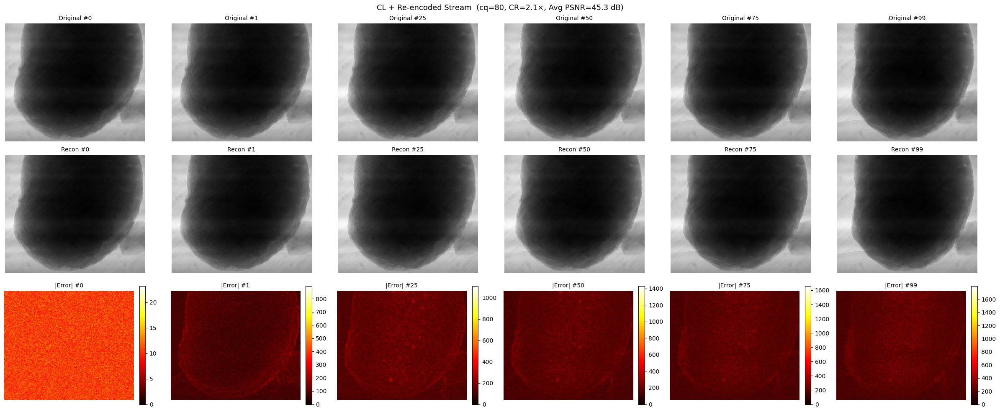

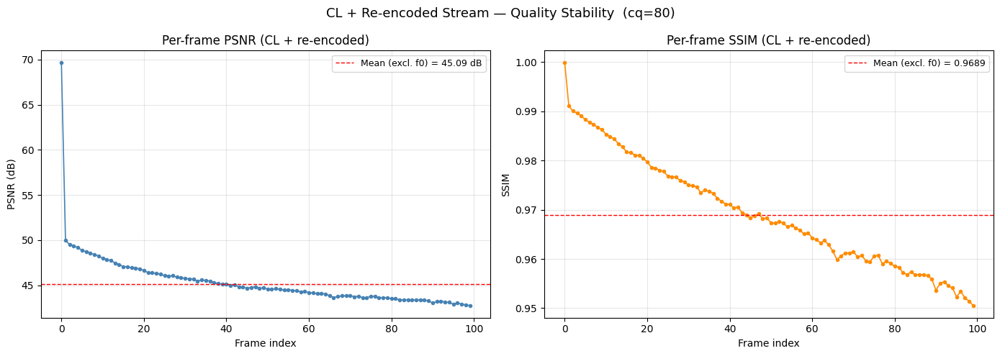

 Frame  PSNR (dB)     SSIM
     0      69.66   0.9999 ← anchor
     1      49.95   0.9911
     2      49.52   0.9901
     3      49.36   0.9896
     4      49.17   0.9891
     5      48.88   0.9883
     6      48.71   0.9878
     7      48.58   0.9874
     8      48.38   0.9867
     9      48.26   0.9863
    10      47.98   0.9854
    11      47.86   0.9849
    12      47.74   0.9844
    13      47.48   0.9834
    14      47.32   0.9828
    15      47.07   0.9818
    16      47.05   0.9816
    17      46.93   0.9811
    18      46.92   0.9810
    19      46.80   0.9805
    20      46.64   0.9798
    21      46.39   0.9786
    22      46.37   0.9784
    23      46.30   0.9781
    24      46.25   0.9778
    25      46.06   0.9768
    26      46.04   0.9767
    27      46.05   0.9767
    28      45.90   0.9759
    29      45.87   0.9757
    30      45.74   0.9750
    31      45.71   0.9748
    32      45.69   0.9747
    33      45.45   0.9734
    34      45.59   0.9741
    35      45.53  

In [15]:
# ── Visualise reconstructed frames vs originals ─────────────────────────
show_idxs_seq = [0, 1, n_frames_seq // 4, n_frames_seq // 2, 3 * n_frames_seq // 4, n_frames_seq - 1]
show_idxs_seq = sorted(set(i for i in show_idxs_seq if i < n_frames_seq))

fig, axes = plt.subplots(3, len(show_idxs_seq), figsize=(4 * len(show_idxs_seq), 10))

for col, fi in enumerate(show_idxs_seq):
    orig_f = volume[:, :, fi].cpu().numpy()
    rec_f  = seq_recon[fi].cpu().numpy()
    diff_f = np.abs(orig_f - rec_f)

    vmin, vmax = orig_f.min(), orig_f.max()

    axes[0, col].imshow(orig_f, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0, col].set_title(f'Original #{fi}', fontsize=10)
    axes[0, col].axis('off')

    axes[1, col].imshow(rec_f, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1, col].set_title(f'Recon #{fi}', fontsize=10)
    axes[1, col].axis('off')

    im = axes[2, col].imshow(diff_f, cmap='hot')
    axes[2, col].set_title(f'|Error| #{fi}', fontsize=10)
    axes[2, col].axis('off')
    plt.colorbar(im, ax=axes[2, col], fraction=0.046, pad=0.04)

axes[0, 0].set_ylabel('Original', fontsize=11)
axes[1, 0].set_ylabel('Reconstructed', fontsize=11)
axes[2, 0].set_ylabel('Abs Error', fontsize=11)

plt.suptitle(f'CL + Re-encoded Stream  (cq={CQ_SEQ}, CR={cr_seq:.1f}×, '
             f'Avg PSNR={avg_seq_psnr:.1f} dB)', fontsize=13)
plt.tight_layout()
plt.show()

# ── Per-frame PSNR/SSIM stability ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

seq_psnrs = [m["psnr"] for m in seq_metrics]
seq_ssims = [m["ssim"] for m in seq_metrics]

axes[0].plot(range(n_frames_seq), seq_psnrs, 'o-', color='steelblue', linewidth=1.2, markersize=3)
axes[0].axhline(avg_seq_psnr_no0, color='red', linestyle='--', linewidth=1,
                label=f'Mean (excl. f0) = {avg_seq_psnr_no0:.2f} dB')
axes[0].set_xlabel('Frame index')
axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('Per-frame PSNR (CL + re-encoded)')
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.3)

axes[1].plot(range(n_frames_seq), seq_ssims, 'o-', color='darkorange', linewidth=1.2, markersize=3)
axes[1].axhline(avg_seq_ssim_no0, color='red', linestyle='--', linewidth=1,
                label=f'Mean (excl. f0) = {avg_seq_ssim_no0:.4f}')
axes[1].set_xlabel('Frame index')
axes[1].set_ylabel('SSIM')
axes[1].set_title('Per-frame SSIM (CL + re-encoded)')
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.suptitle(f'CL + Re-encoded Stream — Quality Stability  (cq={CQ_SEQ})', fontsize=13)
plt.tight_layout()
plt.show()

# ── Per-frame breakdown table ────────────────────────────────────────────
print(f"{'Frame':>6} {'PSNR (dB)':>10} {'SSIM':>8}")
for fi in range(n_frames_seq):
    marker = " ← anchor" if fi == 0 else ""
    print(f"{fi:>6} {seq_metrics[fi]['psnr']:>10.2f} {seq_metrics[fi]['ssim']:>8.4f}{marker}")

## 7. Closed-Loop Per-Segment Residual Encoding (Separate Files)

Same closed-loop residual logic as Section 6 (residuals computed from **decoded** previous frame),
but each frame is encoded as an **independent file** instead of being concatenated.

Two storage backends are supported (set `SEGMENT_FORMATS`):

| Format | Type | Bit depth | Quality param | Notes |
|--------|------|-----------|---------------|-------|
| `"hevc"` | Lossy | 10-bit | `CQ_CL` (0–100) | HEVC I-frame via `HevcGray10Streamer` |
| `"jpeg"` | Lossy | 8-bit | `JPEG_QUALITY` (1–95) | JPEG via Pillow; fast, widely supported |

HEVC has 10-bit precision headroom over JPEG's 8-bit, but JPEG may compress
sparse residuals more efficiently per file (no container overhead).

In [16]:
# ── Closed-loop per-segment residual encoding ────────────────────────────
import math
from sdate.stream_hvec.stream_gray10 import EncoderParams
from sdate.video_compression.hevc_grayscale import decode_hevc_grayscale_10bit
from skimage.metrics import structural_similarity as _skimage_ssim
from PIL import Image
import io

CQ_CL = 80        # quality for HEVC segments
JPEG_QUALITY = 95  # JPEG quality (1–95, higher = better quality / larger files)
SEGMENT_FORMATS = ["hevc", "jpeg", "hevc_img"]  # run all for comparison

n_frames_cl = volume.shape[2]
raw_bytes_per_frame_cl = H * W * 2

# ── HEVC row-image encoder: each image row → 2-row HEVC frame ─────────────
class HevcRowImageEncoder:
    """Encode a 2D grayscale image as HEVC by treating each row as a 2-row video frame.

    HevcGray10Streamer requires frame height ≥ 2, so each row is duplicated
    vertically before encoding. Only the first row of each decoded frame is kept.
    """

    def encode(self, normed_tensor, outdir, prefix, params):
        """Encode a [0,1] float (H, W) tensor. Returns path to the HEVC file."""
        H_img, W_img = normed_tensor.shape
        streamer = HevcGray10Streamer(outdir, segment_prefix=prefix, params=params)
        with streamer.start_segment():
            for row_idx in range(H_img):
                row = normed_tensor[row_idx]           # (W_img,)
                frame = row.unsqueeze(0).repeat(2, 1)  # (2, W_img)
                streamer.append_frame(frame.float())
        return streamer.segments[0]

    def decode(self, path):
        """Decode HEVC row-video back to a [0,1] float32 (H, W) tensor."""
        decoded = decode_hevc_grayscale_10bit(str(path))  # (H_img, 2, W_img)
        return decoded[:, 0, :].float()  # (H_img, W_img)

hevc_img_encoder = HevcRowImageEncoder()

# ── Helpers for JPEG 8-bit grayscale encode/decode ───────────────────────
def encode_jpeg_gray(normed_tensor, path, quality=95):
    """Save a [0,1] float tensor as 8-bit grayscale JPEG."""
    arr = (normed_tensor.cpu().numpy() * 255).clip(0, 255).astype(np.uint8)
    img = Image.fromarray(arr, mode='L')
    img.save(str(path), format='JPEG', quality=quality)

def decode_jpeg_gray(path):
    """Load a grayscale JPEG back to a [0,1] float32 tensor."""
    img = Image.open(str(path)).convert('L')
    arr = np.array(img, dtype=np.float32) / 255.0
    return torch.from_numpy(arr)

# ── Metric helpers ───────────────────────────────────────────────────────
def _psnr_cl(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    mse = float(np.mean((np.clip(pred, tgt.min(), tgt.max()) - tgt) ** 2))
    return 10 * math.log10(dr ** 2 / (mse + 1e-10))

def _ssim_cl(pred, tgt):
    dr = float(tgt.max() - tgt.min())
    return float(_skimage_ssim(tgt, np.clip(pred, tgt.min(), tgt.max()), data_range=dr))

# ── Run closed-loop for each format ──────────────────────────────────────
cl_results = {}  # keyed by format name

for fmt in SEGMENT_FORMATS:
    print(f"\n{'═'*60}")
    print(f"  Format: {fmt.upper()}")
    print(f"{'═'*60}")

    cl_outdir = Path(f'closed_loop_output_{fmt}')
    cl_outdir.mkdir(parents=True, exist_ok=True)

    cl_norms = []
    cl_paths = []
    cl_recon = torch.zeros(n_frames_cl, H, W)

    params_cl = EncoderParams(
        cq_hw=CQ_CL, preset_sw="medium", fps=30, force_software=False,
    )
    params_cl_0 = EncoderParams(
        cq_hw=100, preset_sw="medium", fps=30, force_software=False,
    )

    if fmt == "hevc":
        fmt_detail = f"cq={CQ_CL}"
    elif fmt == "jpeg":
        fmt_detail = f"JPEG quality={JPEG_QUALITY}"
    else:
        fmt_detail = f"row-video cq={CQ_CL}"
    print(f"Closed-loop per-segment encoding: {n_frames_cl} frames ({fmt_detail})")
    print(f"{'─'*60}")

    for fi in range(n_frames_cl):
        orig_frame = volume[:, :, fi]

        if fi == 0:
            signal = orig_frame.clone()
            label = "frame"
        else:
            signal = cl_recon[fi - 1] - orig_frame
            label = "resid"

        fmin, fmax = float(signal.min()), float(signal.max())
        cl_norms.append((fmin, fmax))
        normed = (signal - fmin) / (fmax - fmin + 1e-8)

        if fmt == "hevc":
            streamer_cl = HevcGray10Streamer(
                cl_outdir, segment_prefix=f"cl_{fi:04d}",
                params=params_cl if fi > 0 else params_cl_0,
            )
            with streamer_cl.start_segment():
                streamer_cl.append_frame(normed.float())
            seg_path = streamer_cl.segments[0]
            cl_paths.append(seg_path)
            decoded_frame = decode_hevc_grayscale_10bit(str(seg_path))[0].float()
        elif fmt == "jpeg":
            seg_path = cl_outdir / f"cl_{fi:04d}.jpg"
            encode_jpeg_gray(normed.float(), seg_path, quality=JPEG_QUALITY)
            cl_paths.append(seg_path)
            decoded_frame = decode_jpeg_gray(seg_path)
        else:  # hevc_img
            seg_path = hevc_img_encoder.encode(
                normed.float(), cl_outdir, f"cl_{fi:04d}",
                params_cl if fi > 0 else params_cl_0,
            )
            cl_paths.append(seg_path)
            decoded_frame = hevc_img_encoder.decode(seg_path)

        denormed = decoded_frame * (fmax - fmin + 1e-8) + fmin

        if fi == 0:
            cl_recon[0] = denormed
        else:
            cl_recon[fi] = cl_recon[fi - 1] - denormed

        seg_bytes = seg_path.stat().st_size
        if fi < 5 or fi == n_frames_cl - 1 or fi % 20 == 0:
            print(f"  [{label}] Frame {fi:3d}: range [{fmin:.6f}, {fmax:.6f}] | "
                  f"seg size: {seg_bytes/1e3:.1f} kB")

    # ── Total storage ────────────────────────────────────────────────────
    total_cl_seg_bytes = sum(p.stat().st_size for p in cl_paths)
    cl_norm_bytes = n_frames_cl * 2 * 4
    total_cl_bytes = total_cl_seg_bytes + cl_norm_bytes
    raw_total_cl = n_frames_cl * raw_bytes_per_frame_cl
    cr_cl = raw_total_cl / total_cl_bytes

    print(f"\n{'─'*60}")
    print(f"  Segments:      {total_cl_seg_bytes / 1e6:.3f} MB ({len(cl_paths)} files)")
    print(f"  Norm metadata: {cl_norm_bytes} B")
    print(f"  Total:         {total_cl_bytes / 1e6:.3f} MB")
    print(f"  Raw (int16):   {raw_total_cl / 1e6:.3f} MB")
    print(f"  CR:            {cr_cl:.2f}×")

    # ── Per-frame metrics ────────────────────────────────────────────────
    cl_metrics = []
    for fi in range(n_frames_cl):
        rec_np = cl_recon[fi].cpu().numpy()
        tgt_np = volume[:, :, fi].cpu().numpy()
        cl_metrics.append({
            "psnr": _psnr_cl(rec_np, tgt_np),
            "ssim": _ssim_cl(rec_np, tgt_np),
        })

    avg_cl_psnr = float(np.mean([m["psnr"] for m in cl_metrics]))
    avg_cl_ssim = float(np.mean([m["ssim"] for m in cl_metrics]))
    avg_cl_psnr_no0 = float(np.mean([m["psnr"] for m in cl_metrics[1:]]))
    avg_cl_ssim_no0 = float(np.mean([m["ssim"] for m in cl_metrics[1:]]))

    print(f"\n  Avg PSNR (all):       {avg_cl_psnr:.2f} dB")
    print(f"  Avg PSNR (excl. f0):  {avg_cl_psnr_no0:.2f} dB")
    print(f"  Avg SSIM (all):       {avg_cl_ssim:.4f}")
    print(f"  Avg SSIM (excl. f0):  {avg_cl_ssim_no0:.4f}")
    print(f"{'─'*60}")

    cl_results[fmt] = {
        "paths": cl_paths,
        "norms": cl_norms,
        "recon": cl_recon.clone(),
        "metrics": cl_metrics,
        "total_bytes": total_cl_bytes,
        "seg_bytes": total_cl_seg_bytes,
        "cr": cr_cl,
        "avg_psnr": avg_cl_psnr,
        "avg_ssim": avg_cl_ssim,
        "avg_psnr_no0": avg_cl_psnr_no0,
        "avg_ssim_no0": avg_cl_ssim_no0,
    }

# ── Comparison table ─────────────────────────────────────────────────────
w = 17
print(f"\n{'═'*88}")
print(f"  HEVC vs JPEG vs HEVC-Img — Closed-Loop Per-Segment Comparison")
print(f"{'═'*88}")
print(f"{'':30} {'HEVC (cq='+str(CQ_CL)+')':>{w}} {'JPEG (q='+str(JPEG_QUALITY)+')':>{w}} {'HEVC-Img (cq='+str(CQ_CL)+')':>{w}}")
print("─" * 88)
for key, label in [("total_bytes", "Total size (MB)"), ("cr", "Compression ratio"),
                   ("avg_psnr", "Avg PSNR (all)"), ("avg_psnr_no0", "Avg PSNR (excl. f0)"),
                   ("avg_ssim", "Avg SSIM (all)"), ("avg_ssim_no0", "Avg SSIM (excl. f0)")]:
    vals = {fmt: cl_results[fmt][key] for fmt in ["hevc", "jpeg", "hevc_img"]}
    if key == "total_bytes":
        row = "  ".join(f"{v/1e6:>{w}.3f}" for v in vals.values())
    elif key == "cr":
        row = "  ".join(f"{v:>{w-1}.2f}×" for v in vals.values())
    elif "psnr" in key:
        row = "  ".join(f"{v:>{w}.2f}" for v in vals.values())
    else:
        row = "  ".join(f"{v:>{w}.4f}" for v in vals.values())
    print(f"{label:30} {row}")
print("─" * 88)


════════════════════════════════════════════════════════════
  Format: HEVC
════════════════════════════════════════════════════════════
Closed-loop per-segment encoding: 100 frames (cq=80)
────────────────────────────────────────────────────────────
  [frame] Frame   0: range [8992.625000, 46449.312500] | seg size: 776.2 kB
  [resid] Frame   1: range [-2440.289062, 1434.769531] | seg size: 504.5 kB
  [resid] Frame   2: range [-2595.226562, 1330.289062] | seg size: 505.7 kB
  [resid] Frame   3: range [-2571.343750, 1255.599609] | seg size: 516.0 kB
  [resid] Frame   4: range [-2897.613281, 1430.791016] | seg size: 463.0 kB
  [resid] Frame  20: range [-2659.375000, 1364.535156] | seg size: 506.0 kB
  [resid] Frame  40: range [-2382.625000, 1253.025391] | seg size: 533.7 kB
  [resid] Frame  60: range [-2138.742188, 1670.707031] | seg size: 516.3 kB
  [resid] Frame  80: range [-2239.527344, 1428.388672] | seg size: 539.9 kB
  [resid] Frame  99: range [-2121.882812, 1491.054688] | seg siz

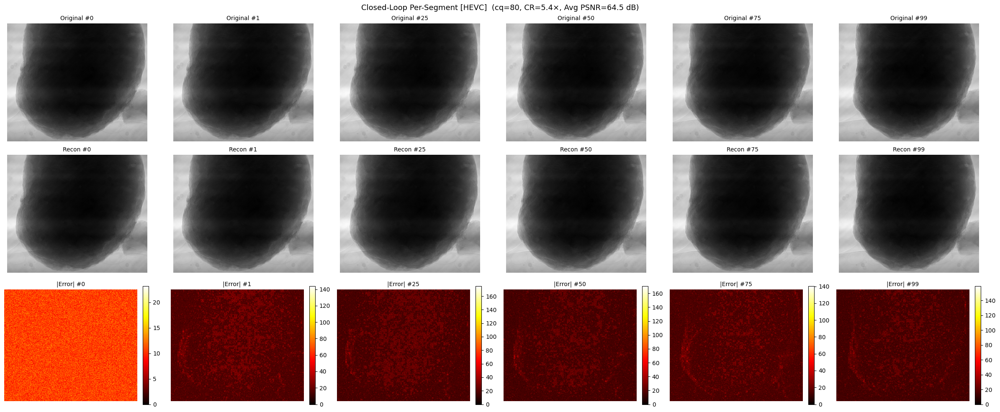

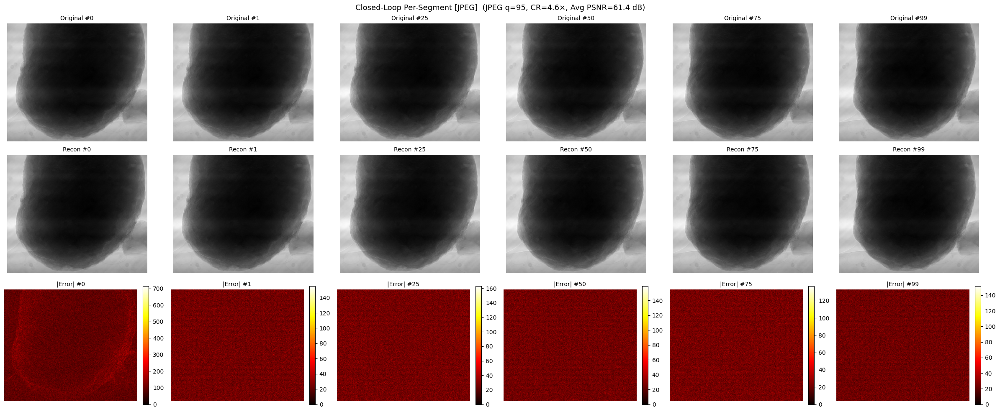

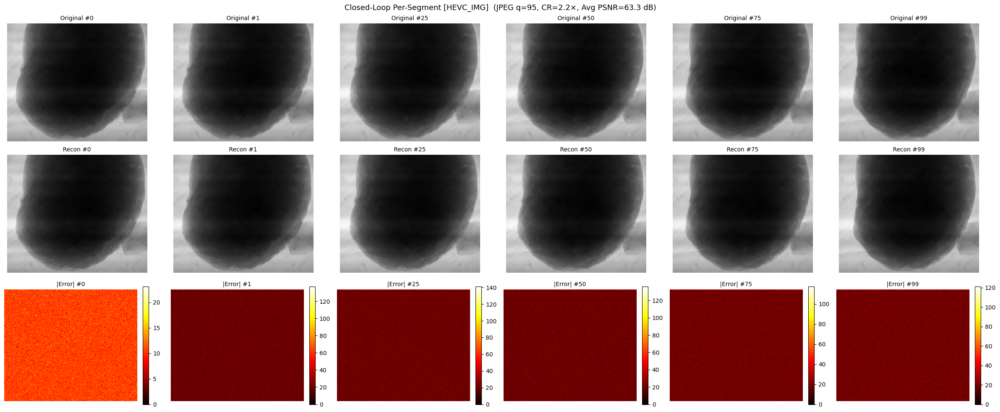

KeyError: 'hevc_img'

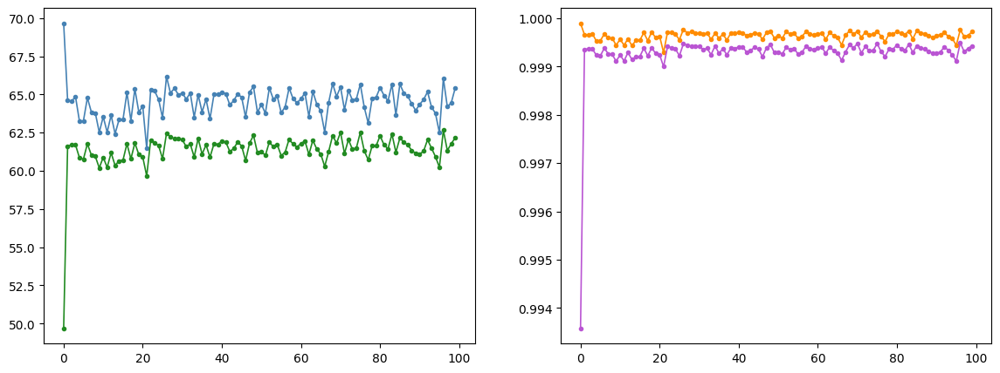

In [17]:
# ── Visualise closed-loop reconstructed frames vs originals (both formats) ─
for fmt in SEGMENT_FORMATS:
    res = cl_results[fmt]
    cl_recon_fmt = res["recon"]
    cl_metrics_fmt = res["metrics"]
    avg_psnr_fmt = res["avg_psnr"]
    avg_psnr_no0_fmt = res["avg_psnr_no0"]
    avg_ssim_no0_fmt = res["avg_ssim_no0"]
    cr_fmt = res["cr"]

    show_idxs_cl = [0, 1, n_frames_cl // 4, n_frames_cl // 2, 3 * n_frames_cl // 4, n_frames_cl - 1]
    show_idxs_cl = sorted(set(i for i in show_idxs_cl if i < n_frames_cl))

    fig, axes = plt.subplots(3, len(show_idxs_cl), figsize=(4 * len(show_idxs_cl), 10))
    for col, fi in enumerate(show_idxs_cl):
        orig_f = volume[:, :, fi].cpu().numpy()
        rec_f  = cl_recon_fmt[fi].cpu().numpy()
        diff_f = np.abs(orig_f - rec_f)
        vmin, vmax = orig_f.min(), orig_f.max()

        axes[0, col].imshow(orig_f, cmap='gray', vmin=vmin, vmax=vmax)
        axes[0, col].set_title(f'Original #{fi}', fontsize=10); axes[0, col].axis('off')
        axes[1, col].imshow(rec_f, cmap='gray', vmin=vmin, vmax=vmax)
        axes[1, col].set_title(f'Recon #{fi}', fontsize=10); axes[1, col].axis('off')
        im = axes[2, col].imshow(diff_f, cmap='hot')
        axes[2, col].set_title(f'|Error| #{fi}', fontsize=10); axes[2, col].axis('off')
        plt.colorbar(im, ax=axes[2, col], fraction=0.046, pad=0.04)

    axes[0, 0].set_ylabel('Original', fontsize=11)
    axes[1, 0].set_ylabel('Reconstructed', fontsize=11)
    axes[2, 0].set_ylabel('Abs Error', fontsize=11)
    title_label = f"cq={CQ_CL}" if fmt == "hevc" else f"JPEG q={JPEG_QUALITY}"
    plt.suptitle(f'Closed-Loop Per-Segment [{fmt.upper()}]  ({title_label}, CR={cr_fmt:.1f}×, '
                 f'Avg PSNR={avg_psnr_fmt:.1f} dB)', fontsize=13)
    plt.tight_layout(); plt.show()

# ── Per-frame PSNR/SSIM stability — overlay both formats ────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fmt_colors = {"hevc": "steelblue", "jpeg": "forestgreen"}
fmt_colors_ssim = {"hevc": "darkorange", "jpeg": "mediumorchid"}

for fmt in SEGMENT_FORMATS:
    res = cl_results[fmt]
    psnrs = [m["psnr"] for m in res["metrics"]]
    ssims = [m["ssim"] for m in res["metrics"]]

    axes[0].plot(range(n_frames_cl), psnrs, 'o-', color=fmt_colors[fmt],
                 linewidth=1.2, markersize=3, label=f'{fmt.upper()} (mean={res["avg_psnr_no0"]:.2f} dB)')
    axes[1].plot(range(n_frames_cl), ssims, 'o-', color=fmt_colors_ssim[fmt],
                 linewidth=1.2, markersize=3, label=f'{fmt.upper()} (mean={res["avg_ssim_no0"]:.4f})')

axes[0].set_xlabel('Frame index'); axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('Per-frame PSNR (closed-loop per-segment)'); axes[0].legend(fontsize=9); axes[0].grid(True, alpha=0.3)
axes[1].set_xlabel('Frame index'); axes[1].set_ylabel('SSIM')
axes[1].set_title('Per-frame SSIM (closed-loop per-segment)'); axes[1].legend(fontsize=9); axes[1].grid(True, alpha=0.3)
plt.suptitle('Closed-Loop Per-Segment — HEVC vs JPEG Quality Stability', fontsize=13)
plt.tight_layout(); plt.show()

# ── Per-segment file sizes — overlay both formats ───────────────────────
fig, ax = plt.subplots(figsize=(14, 4))
for fmt in SEGMENT_FORMATS:
    sizes = [p.stat().st_size / 1e3 for p in cl_results[fmt]["paths"]]
    ax.plot(range(n_frames_cl), sizes, 'o-' if fmt == "hevc" else 's-',
            color=fmt_colors[fmt], linewidth=1.2, markersize=3,
            label=f'{fmt.upper()} (mean={np.mean(sizes):.1f} kB)', alpha=0.8)
ax.set_xlabel('Frame index'); ax.set_ylabel('Segment size (kB)')
ax.set_title('Per-frame segment size comparison (frame 0 = full frame, rest = residuals)')
ax.legend(fontsize=9); ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.show()

# ── Comparison table ─────────────────────────────────────────────────────
print(f"{'':30} {'CL Re-encoded (§6)':>20} {'CL HEVC (§7)':>20} {'CL JPEG (§7)':>20}")
print("─" * 92)
print(f"{'Quality':30} {'cq=' + str(CQ_SEQ):>20} {'cq=' + str(CQ_CL):>20} {'q=' + str(JPEG_QUALITY):>20}")
print(f"{'Total size (MB)':30} {total_seq_bytes/1e6:>20.3f} {cl_results['hevc']['total_bytes']/1e6:>20.3f} {cl_results['jpeg']['total_bytes']/1e6:>20.3f}")
print(f"{'Compression ratio':30} {cr_seq:>19.2f}× {cl_results['hevc']['cr']:>19.2f}× {cl_results['jpeg']['cr']:>19.2f}×")
print(f"{'Avg PSNR (excl. f0)':30} {avg_seq_psnr_no0:>19.2f}  {cl_results['hevc']['avg_psnr_no0']:>19.2f}  {cl_results['jpeg']['avg_psnr_no0']:>19.2f} ")
print(f"{'Avg SSIM (excl. f0)':30} {avg_seq_ssim_no0:>19.4f}  {cl_results['hevc']['avg_ssim_no0']:>19.4f}  {cl_results['jpeg']['avg_ssim_no0']:>19.4f} ")

## 4. HEVC Compression Quality Sweep

Compress the same 20 frames using **HEVC (H.265) 10-bit** via `HevcGray10Streamer` at multiple quality levels.

For each quality level we measure:
- **PSNR** and **SSIM** vs the original normalised frames
- **Compression ratio** relative to the raw int16 baseline ($H \times W \times 2$ bytes/frame)

This mirrors the metrics used in `GSplat_Video_Compression` so results can be compared directly.

In [ ]:
import math
from sdate.stream_hvec.stream_gray10 import EncoderParams
from sdate.video_compression.hevc_grayscale import decode_hevc_grayscale_10bit
from skimage.metrics import structural_similarity as _skimage_ssim

def _psnr(prediction: np.ndarray, target: np.ndarray) -> float:
    """PSNR (dB) — same formula as gsplat_compress.metrics.psnr."""
    data_range = float(target.max() - target.min())
    mse = float(np.mean((np.clip(prediction, target.min(), target.max()) - target) ** 2))
    return 10 * math.log10(data_range ** 2 / (mse + 1e-10))

def _ssim(prediction: np.ndarray, target: np.ndarray) -> float:
    """SSIM — same formula as gsplat_compress.metrics.ssim."""
    data_range = float(target.max() - target.min())
    return float(_skimage_ssim(target, np.clip(prediction, 0, 1), data_range=data_range))

print("✅ HEVC helper functions ready")

✅ HEVC helper functions ready


In [ ]:
# ── Quality levels to sweep ───────────────────────────────────────────────
# cq_hw: VideoToolbox quality (0–100, higher = better quality)
# crf_sw: libx265 CRF for software fallback (lower = better quality)
QUALITY_LEVELS = [
    {"label": "VHQ  (cq=100, crf=10)", "cq_hw": 100},
    {"label": "HQ   (cq=99, crf=18)", "cq_hw": 99},
    # {"label": "MQ   (cq=98, crf=26)", "cq_hw": 98},
    # {"label": "LQ   (cq=97, crf=32)", "cq_hw": 97},
    # {"label": "VLQ  (cq=96, crf=38)", "cq_hw": 96},
    # {"label": "VHQ  (cq=90, crf=10)", "cq_hw": 90},
]

raw_bytes_per_frame = H * W * 2  # int16 baseline (2 bytes per pixel)
print(f"Raw frame size: {raw_bytes_per_frame / 1e3:.1f} kB  ({H}×{W} px × 2 B)")
print(f"Total raw for {N_FRAMES} frames: {N_FRAMES * raw_bytes_per_frame / 1e6:.2f} MB\n")

frames_np = [(f).cpu().numpy() for f in frames]   # list of (H,W) float32 arrays

outdir = Path('hevc_quality_sweep')
outdir.mkdir(parents=True, exist_ok=True)

hevc_results = []

for ql in QUALITY_LEVELS:
    label = ql["label"]
    print(f"▶  {label}")

    params = EncoderParams(
        cq_hw=ql["cq_hw"],
        preset_sw="medium",   # faster than 'veryslow' for a notebook sweep
        fps=30,
        force_software=False,  # use hardware encoder if available (VideoToolbox on macOS
    )

    streamer = HevcGray10Streamer(outdir, segment_prefix=f"q{ql['cq_hw']}", params=params)
    with streamer.start_segment():
        for frame in frames:
            streamer.append_frame(frame.float())
    
    seg_path = streamer.segments[0]
    total_compressed_bytes = seg_path.stat().st_size
    per_frame_bytes = total_compressed_bytes / N_FRAMES

    # Decode the compressed video back to float32 frames
    decoded = decode_hevc_grayscale_10bit(str(seg_path))  # (T, H, W)

    # Per-frame metrics
    frame_metrics = []
    for i in range(len(frames)):
        dec_np = decoded[i].numpy()
        tgt_np = frames_np[i]
        frame_metrics.append({
            "psnr": _psnr(dec_np, tgt_np),
            "ssim": _ssim(dec_np, tgt_np),
        })

    avg_psnr = float(np.mean([m["psnr"] for m in frame_metrics]))
    avg_ssim = float(np.mean([m["ssim"] for m in frame_metrics]))
    cr = raw_bytes_per_frame / per_frame_bytes

    hevc_results.append({
        "label":              label,
        "cq_hw":              ql["cq_hw"],
        "total_bytes":        total_compressed_bytes,
        "per_frame_bytes":    per_frame_bytes,
        "avg_psnr":           avg_psnr,
        "avg_ssim":           avg_ssim,
        "compression_ratio":  cr,
        "frame_metrics":      frame_metrics,
    })

    print(f"     PSNR: {avg_psnr:.2f} dB | SSIM: {avg_ssim:.4f} | "
          f"CR: {cr:.2f}× | Size: {total_compressed_bytes/1e6:.3f} MB")

print("\n✅ HEVC quality sweep complete")

Raw frame size: 2764.8 kB  (1080×1280 px × 2 B)
Total raw for 100 frames: 276.48 MB

▶  VHQ  (cq=100, crf=10)
     PSNR: 69.65 dB | SSIM: 0.9999 | CR: 4.00× | Size: 69.171 MB
▶  HQ   (cq=99, crf=18)
     PSNR: 56.62 dB | SSIM: 0.9979 | CR: 11.26× | Size: 24.551 MB

✅ HEVC quality sweep complete


In [ ]:
# ── Summary table ────────────────────────────────────────────────────────
print(f"{'Quality':30} {'Avg PSNR':>10} {'Avg SSIM':>10} {'CR':>8} {'Total (MB)':>12} {'Per-frame (kB)':>16}")
print("─" * 90)
for r in hevc_results:
    print(f"{r['label']:30} {r['avg_psnr']:>10.2f} {r['avg_ssim']:>10.4f} "
          f"{r['compression_ratio']:>8.2f}× {r['total_bytes']/1e6:>11.3f}  "
          f"{r['per_frame_bytes']/1e3:>14.1f}")

print(f"\n  Raw frame:  {raw_bytes_per_frame/1e3:.1f} kB")
print(f"  Raw total:  {N_FRAMES * raw_bytes_per_frame / 1e6:.3f} MB")

Quality                          Avg PSNR   Avg SSIM       CR   Total (MB)   Per-frame (kB)
──────────────────────────────────────────────────────────────────────────────────────────
VHQ  (cq=100, crf=10)               69.65     0.9999     4.00×      69.171           691.7
HQ   (cq=99, crf=18)                56.62     0.9979    11.26×      24.551           245.5

  Raw frame:  2764.8 kB
  Raw total:  276.480 MB


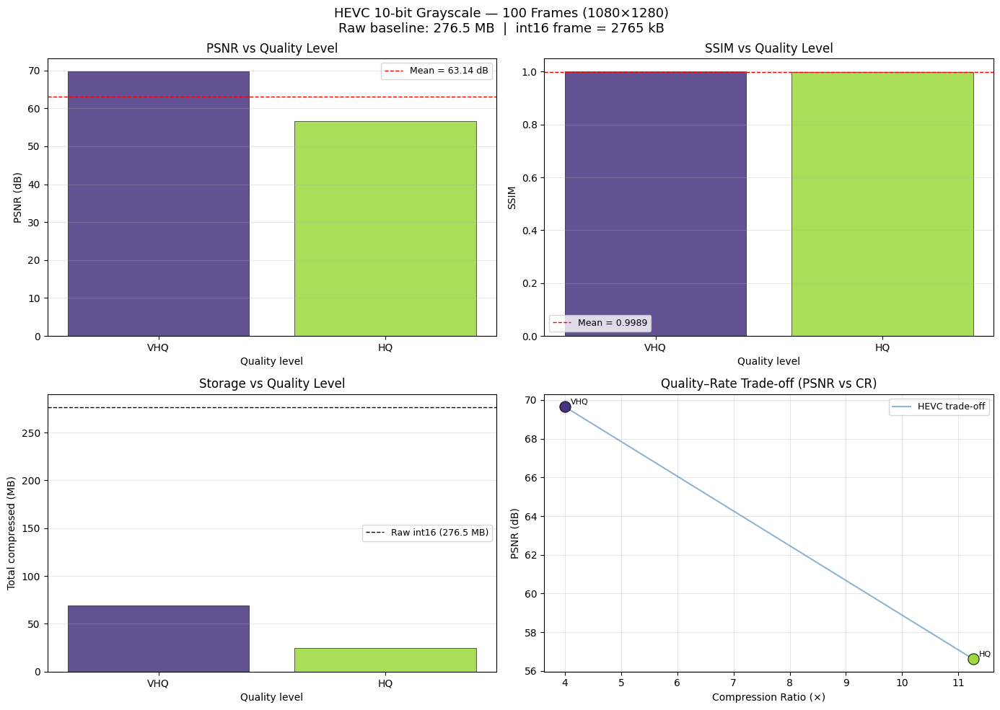

In [ ]:
# ── PSNR / SSIM / Storage vs compression ratio ──────────────────────────
labels  = [r["label"].strip().split()[0] for r in hevc_results]  # short label
psnrs   = [r["avg_psnr"]          for r in hevc_results]
ssims   = [r["avg_ssim"]          for r in hevc_results]
crs     = [r["compression_ratio"] for r in hevc_results]
bytes_m = [r["total_bytes"] / 1e6 for r in hevc_results]
colors  = plt.cm.viridis(np.linspace(0.15, 0.85, len(hevc_results)))

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# ── PSNR per quality level ────────────────────────────────────────────────
axes[0, 0].bar(labels, psnrs, color=colors, alpha=0.85, edgecolor='black', linewidth=0.5)
axes[0, 0].axhline(np.mean(psnrs), color='red', linestyle='--', linewidth=1,
                   label=f'Mean = {np.mean(psnrs):.2f} dB')
axes[0, 0].set_xlabel('Quality level'); axes[0, 0].set_ylabel('PSNR (dB)')
axes[0, 0].set_title('PSNR vs Quality Level'); axes[0, 0].legend(fontsize=9)
axes[0, 0].grid(True, alpha=0.3, axis='y')

# ── SSIM per quality level ────────────────────────────────────────────────
axes[0, 1].bar(labels, ssims, color=colors, alpha=0.85, edgecolor='black', linewidth=0.5)
axes[0, 1].axhline(np.mean(ssims), color='red', linestyle='--', linewidth=1,
                   label=f'Mean = {np.mean(ssims):.4f}')
axes[0, 1].set_xlabel('Quality level'); axes[0, 1].set_ylabel('SSIM')
axes[0, 1].set_title('SSIM vs Quality Level'); axes[0, 1].legend(fontsize=9)
axes[0, 1].grid(True, alpha=0.3, axis='y')

# ── Storage per quality level ─────────────────────────────────────────────
raw_total_mb = N_FRAMES * raw_bytes_per_frame / 1e6
axes[1, 0].bar(labels, bytes_m, color=colors, alpha=0.85, edgecolor='black', linewidth=0.5)
axes[1, 0].axhline(raw_total_mb, color='black', linestyle='--', linewidth=1,
                   label=f'Raw int16 ({raw_total_mb:.1f} MB)')
axes[1, 0].set_xlabel('Quality level'); axes[1, 0].set_ylabel('Total compressed (MB)')
axes[1, 0].set_title('Storage vs Quality Level'); axes[1, 0].legend(fontsize=9)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# ── PSNR vs Compression Ratio (quality–rate trade-off curve) ─────────────
for i, r in enumerate(hevc_results):
    axes[1, 1].scatter(r["compression_ratio"], r["avg_psnr"],
                       color=colors[i], s=120, zorder=5, edgecolors='black', linewidths=0.7)
    axes[1, 1].annotate(labels[i], (r["compression_ratio"], r["avg_psnr"]),
                        textcoords="offset points", xytext=(6, 2), fontsize=8)
axes[1, 1].plot(crs, psnrs, color='steelblue', linewidth=1.5, linestyle='-', alpha=0.6,
                label='HEVC trade-off')
axes[1, 1].set_xlabel('Compression Ratio (×)'); axes[1, 1].set_ylabel('PSNR (dB)')
axes[1, 1].set_title('Quality–Rate Trade-off (PSNR vs CR)')
axes[1, 1].legend(fontsize=9); axes[1, 1].grid(True, alpha=0.3)

plt.suptitle(f'HEVC 10-bit Grayscale — {N_FRAMES} Frames ({H}×{W})\n'
             f'Raw baseline: {raw_total_mb:.1f} MB  |  int16 frame = {raw_bytes_per_frame/1e3:.0f} kB',
             fontsize=13)
plt.tight_layout()
plt.show()